In [0]:
import pyspark
from pyspark import SparkContext
from pyspark.sql import SQLContext , Row
from pyspark.sql.functions import *
from pyspark.sql.types import IntegerType,FloatType
import pandas as pd 
from pyspark.ml.feature import DenseVector,StandardScaler,VectorAssembler
from pyspark.ml.feature import StringIndexer
from pyspark.ml import Pipeline

In [0]:
sc = SparkContext.getOrCreate()
sql_sc = SQLContext(sc)
sc

/databricks/spark/python/pyspark/sql/context.py:116: FutureWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
  warnings.warn(


<SparkContext master=local[8] appName=Databricks Shell>

In [0]:
Complaint_df = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/salamanca-andres@javeriana.edu.co/NYPD_Complaint_Data_Current__Year_To_Date__20240402.csv")
Complaint_df.show()

+-----------+-----------+-------------+------------+------------+------------+------------+----------------+----------+-----------+-----------------+-------------------+-----+-----------+-----------------+--------------------+--------+--------------------+-----+--------------------+--------------------+----------+------------+--------------+--------------+--------+----------------+-------------+--------------+-------+----------+----------+------------------+------------------+--------------------+------------------------+
| CMPLNT_NUM|ADDR_PCT_CD|      BORO_NM|CMPLNT_FR_DT|CMPLNT_FR_TM|CMPLNT_TO_DT|CMPLNT_TO_TM|CRM_ATPT_CPTD_CD|HADEVELOPT|HOUSING_PSA|JURISDICTION_CODE|         JURIS_DESC|KY_CD| LAW_CAT_CD|LOC_OF_OCCUR_DESC|           OFNS_DESC|PARKS_NM|         PATROL_BORO|PD_CD|             PD_DESC|       PREM_TYP_DESC|    RPT_DT|STATION_NAME|SUSP_AGE_GROUP|     SUSP_RACE|SUSP_SEX|TRANSIT_DISTRICT|VIC_AGE_GROUP|      VIC_RACE|VIC_SEX|X_COORD_CD|Y_COORD_CD|          Latitude|         L

In [0]:
Complaint_df.count()

555117

primero se remplazaran los diferentes valores de nulos que se usaron en el dataset para que todos queden como uno

In [0]:
Complaint_df = Complaint_df.replace("(null)", None)
Complaint_df = Complaint_df.replace("UNKNOWN", None)
Complaint_df = Complaint_df.replace("U", None)


In [0]:
Complaint_df.select([count(when(isnan(c) | col(c).isNull() , c)).alias(c) for c in Complaint_df.columns]).toPandas()

,CMPLNT_NUM,ADDR_PCT_CD,BORO_NM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,CRM_ATPT_CPTD_CD,HADEVELOPT,HOUSING_PSA,JURISDICTION_CODE,JURIS_DESC,KY_CD,LAW_CAT_CD,LOC_OF_OCCUR_DESC,OFNS_DESC,PARKS_NM,PATROL_BORO,PD_CD,PD_DESC,PREM_TYP_DESC,RPT_DT,STATION_NAME,SUSP_AGE_GROUP,SUSP_RACE,SUSP_SEX,TRANSIT_DISTRICT,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lat_Lon,New Georeferenced Column
0,0,70,1019,0,0,34738,34325,0,553360,519092,0,0,0,0,111769,17,551791,0,386,386,22212,0,540384,286537,220259,195712,540384,160142,173461,0,12,12,12,12,12,12


primero se eliminaran las columnas de datos mayoritariamente nulos 
 - Numero total de columnas 555117

In [0]:
total_rows = Complaint_df.count()
# Calcula el porcentaje de valores nulos para cada columna
Complaint_df.select([((count(when(isnan(c) | col(c).isNull(), c)) / total_rows) * 100).alias(c) for c in Complaint_df.columns]).toPandas()



,CMPLNT_NUM,ADDR_PCT_CD,BORO_NM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,CRM_ATPT_CPTD_CD,HADEVELOPT,HOUSING_PSA,JURISDICTION_CODE,JURIS_DESC,KY_CD,LAW_CAT_CD,LOC_OF_OCCUR_DESC,OFNS_DESC,PARKS_NM,PATROL_BORO,PD_CD,PD_DESC,PREM_TYP_DESC,RPT_DT,STATION_NAME,SUSP_AGE_GROUP,SUSP_RACE,SUSP_SEX,TRANSIT_DISTRICT,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lat_Lon,New Georeferenced Column
0,0.0,0.01261,0.183565,0.0,0.0,6.25778,6.183381,0.0,99.68349,93.510377,0.0,0.0,0.0,0.0,20.134314,0.003062,99.400847,0.0,0.069535,0.069535,4.001319,0.0,97.345965,51.617407,39.677942,35.255991,97.345965,28.848333,31.247647,0.0,0.002162,0.002162,0.002162,0.002162,0.002162,0.002162


segun el procentaje de de valores nulos por columna los siguientes datos que se van a borrar seran:
 - TRANSIT_DISTRICT
 - STATION_NAME
 - PARKS_NM
 - HOUSING_PSA
 - HADEVELOPT

In [0]:
# Lista de columnas a eliminar
columns_to_drop = ['TRANSIT_DISTRICT', 'STATION_NAME', 'PARKS_NM', 'HOUSING_PSA', 'HADEVELOPT','CMPLNT_NUM', 'CMPLNT_TO_DT', 'CMPLNT_TO_TM','OFNS_DESC','PATROL_BORO','PD_CD','RPT_DT','STATION_NAME','TRANSIT_DISTRICT']


# Elimina las columnas especificadas
Complaint_df = Complaint_df.drop(*columns_to_drop)
Complaint_df.columns

['ADDR_PCT_CD',
 'BORO_NM',
 'CMPLNT_FR_DT',
 'CMPLNT_FR_TM',
 'CRM_ATPT_CPTD_CD',
 'JURISDICTION_CODE',
 'JURIS_DESC',
 'KY_CD',
 'LAW_CAT_CD',
 'LOC_OF_OCCUR_DESC',
 'PD_DESC',
 'PREM_TYP_DESC',
 'SUSP_AGE_GROUP',
 'SUSP_RACE',
 'SUSP_SEX',
 'VIC_AGE_GROUP',
 'VIC_RACE',
 'VIC_SEX',
 'X_COORD_CD',
 'Y_COORD_CD',
 'Latitude',
 'Longitude',
 'Lat_Lon',
 'New Georeferenced Column']

In [0]:
from pyspark.sql.functions import count, when, col

# Assuming `Complaint_df` is your DataFrame
total_rows = Complaint_df.count()

# Calculating percentage of missing values for each column
missing_percentages = Complaint_df.select([
    ((count(when(col(c).isNull(), c)) / total_rows) * 100).alias(c)
    for c in Complaint_df.columns
]).toPandas()

# Displaying missing percentages
print(missing_percentages)


   ADDR_PCT_CD   BORO_NM  ...   Lat_Lon  New Georeferenced Column
0      0.01261  0.183565  ...  0.002162                  0.002162

[1 rows x 24 columns]


luego de esto se va a imputar los datos por moda los datos los cuales se imputaran seran los sigueintes

In [0]:
display(Complaint_df)

ADDR_PCT_CD,BORO_NM,CMPLNT_FR_DT,CMPLNT_FR_TM,CRM_ATPT_CPTD_CD,JURISDICTION_CODE,JURIS_DESC,KY_CD,LAW_CAT_CD,LOC_OF_OCCUR_DESC,PD_DESC,PREM_TYP_DESC,SUSP_AGE_GROUP,SUSP_RACE,SUSP_SEX,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lat_Lon,New Georeferenced Column
42,BRONX,06/03/2023,01:00:00,COMPLETED,0,N.Y. POLICE DEPT,105,FELONY,null,"ROBBERY,BICYCLE",STREET,null,BLACK,M,25-44,BLACK HISPANIC,M,1011982,239520,40.82405906,-73.89979939,"(40.82405906, -73.89979939)",POINT (-73.89979939 40.82405906)
43,BRONX,01/18/2023,14:00:00,COMPLETED,0,N.Y. POLICE DEPT,113,FELONY,null,"FORGERY,M.V. REGISTRATION",STREET,18-24,BLACK,M,null,null,E,1019635,243829,40.83585867,-73.87212505,"(40.83585867, -73.87212505)",POINT (-73.87212505 40.83585867)
43,BRONX,05/07/2023,00:15:00,COMPLETED,0,N.Y. POLICE DEPT,106,FELONY,FRONT OF,STRANGULATION 1ST,STREET,25-44,BLACK,M,25-44,BLACK,F,1022051,242244,40.8315,-73.8634,"(40.8315, -73.8634)",POINT (-73.8634 40.8315)
null,BROOKLYN,02/06/2023,10:16:00,COMPLETED,0,N.Y. POLICE DEPT,101,FELONY,OUTSIDE,null,MULTI DWELL - APT BUILD,18-24,BLACK,M,18-24,BLACK,M,null,null,null,null,null,null
null,BROOKLYN,06/04/2023,00:20:00,COMPLETED,0,N.Y. POLICE DEPT,101,FELONY,OUTSIDE,null,null,25-44,BLACK,M,25-44,BLACK,M,null,null,null,null,null,null
null,QUEENS,11/14/2023,07:05:00,COMPLETED,0,N.Y. POLICE DEPT,101,FELONY,INSIDE,null,PVT HOUSE,45-64,BLACK,M,45-64,BLACK,M,null,null,null,null,null,null
null,QUEENS,11/14/2023,07:05:00,COMPLETED,0,N.Y. POLICE DEPT,101,FELONY,INSIDE,null,PVT HOUSE,45-64,BLACK,M,45-64,BLACK,F,null,null,null,null,null,null
null,BROOKLYN,07/05/2020,21:45:00,COMPLETED,2,N.Y. HOUSING POLICE,101,FELONY,OUTSIDE,null,MULTI DWELL - PUBLIC HOUS,null,null,null,25-44,BLACK,M,null,null,null,null,null,null
null,MANHATTAN,06/21/2023,16:25:00,COMPLETED,0,N.Y. POLICE DEPT,101,FELONY,OUTSIDE,null,null,25-44,BLACK,M,25-44,BLACK,M,null,null,null,null,null,null
123,STATEN ISLAND,12/14/2023,02:50:00,COMPLETED,0,N.Y. POLICE DEPT,235,MISDEMEANOR,null,"CONTROLLED SUBSTANCE, POSSESSI",STREET,25-44,WHITE,M,null,null,E,934105,138444,40.54653060020265,-74.18043031626128,"(40.54653060020265, -74.18043031626128)",POINT (-74.18043031626128 40.54653060020265)


Databricks data profile. Run in Databricks to view.

In [0]:
Complaint_df.summary().toPandas()

com.databricks.backend.common.rpc.CommandCancelledException
	at com.databricks.spark.chauffeur.SequenceExecutionState.$anonfun$cancel$3(SequenceExecutionState.scala:103)
	at scala.Option.getOrElse(Option.scala:189)
	at com.databricks.spark.chauffeur.SequenceExecutionState.$anonfun$cancel$2(SequenceExecutionState.scala:103)
	at com.databricks.spark.chauffeur.SequenceExecutionState.$anonfun$cancel$2$adapted(SequenceExecutionState.scala:100)
	at scala.collection.immutable.Range.foreach(Range.scala:158)
	at com.databricks.spark.chauffeur.SequenceExecutionState.cancel(SequenceExecutionState.scala:100)
	at com.databricks.spark.chauffeur.ExecContextState.cancelRunningSequence(ExecContextState.scala:714)
	at com.databricks.spark.chauffeur.ExecContextState.$anonfun$cancel$1(ExecContextState.scala:430)
	at scala.Option.getOrElse(Option.scala:189)
	at com.databricks.spark.chauffeur.ExecContextState.cancel(ExecContextState.scala:430)
	at com.databricks.spark.chauffeur.ChauffeurState.cancelExecutio

In [0]:
mode_BORO_NM = Complaint_df.groupBy("BORO_NM").count().orderBy(col("count").desc()).select("BORO_NM").limit(1).collect()[0][0]
mode_BORO_NM

'BROOKLYN'

In [0]:
Complaint_df.select([count(when(isnan(c) | col(c).isNull() , c)).alias(c) for c in Complaint_df.columns]).toPandas()

,ADDR_PCT_CD,BORO_NM,CMPLNT_FR_DT,CMPLNT_FR_TM,CRM_ATPT_CPTD_CD,JURISDICTION_CODE,JURIS_DESC,KY_CD,LAW_CAT_CD,LOC_OF_OCCUR_DESC,PD_DESC,PREM_TYP_DESC,SUSP_AGE_GROUP,SUSP_RACE,SUSP_SEX,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lat_Lon,New Georeferenced Column
0,70,1019,0,0,0,0,0,0,0,111769,386,22212,286537,220259,195712,160142,173461,0,12,12,12,12,12,12


In [0]:
from pyspark.sql.functions import approx_count_distinct

# Calcula la moda de ADDR_PCT_CD
mode_addr_pct_cd = Complaint_df.groupBy("ADDR_PCT_CD").count().orderBy(col("count").desc()).select("ADDR_PCT_CD").limit(1).collect()[0][0]
mode_BORO_NM = Complaint_df.groupBy("BORO_NM").count().orderBy(col("count").desc()).select("BORO_NM").limit(1).collect()[0][0]
# Reemplaza los valores nulos en ADDR_PCT_CD con la moda
Complaint_df = Complaint_df.withColumn("ADDR_PCT_CD", when(col("ADDR_PCT_CD").isNull(), mode_addr_pct_cd).otherwise(col("ADDR_PCT_CD")))
Complaint_df = Complaint_df.withColumn("BORO_NM", when(col("BORO_NM").isNull(), mode_BORO_NM).otherwise(col("BORO_NM")))


In [0]:
Complaint_df = Complaint_df.dropna(subset=["Latitude","PD_DESC"])

In [0]:
Complaint_df.groupBy("LOC_OF_OCCUR_DESC").count().orderBy(col("count").desc()).collect()

[Row(LOC_OF_OCCUR_DESC='INSIDE', count=287353),
 Row(LOC_OF_OCCUR_DESC='FRONT OF', count=136627),
 Row(LOC_OF_OCCUR_DESC=None, count=111769),
 Row(LOC_OF_OCCUR_DESC='OPPOSITE OF', count=10691),
 Row(LOC_OF_OCCUR_DESC='REAR OF', count=8291)]

In [0]:
Complaint_df.groupBy("PREM_TYP_DESC").count().orderBy(col("count").desc()).collect()

[Row(PREM_TYP_DESC='STREET', count=162643),
 Row(PREM_TYP_DESC='RESIDENCE - APT. HOUSE', count=115277),
 Row(PREM_TYP_DESC='RESIDENCE-HOUSE', count=47950),
 Row(PREM_TYP_DESC='RESIDENCE - PUBLIC HOUSING', count=35695),
 Row(PREM_TYP_DESC='CHAIN STORE', count=27829),
 Row(PREM_TYP_DESC=None, count=22021),
 Row(PREM_TYP_DESC='TRANSIT - NYC SUBWAY', count=14042),
 Row(PREM_TYP_DESC='DEPARTMENT STORE', count=13937),
 Row(PREM_TYP_DESC='COMMERCIAL BUILDING', count=11305),
 Row(PREM_TYP_DESC='DRUG STORE', count=11025),
 Row(PREM_TYP_DESC='OTHER', count=9718),
 Row(PREM_TYP_DESC='HOMELESS SHELTER', count=8401),
 Row(PREM_TYP_DESC='GROCERY/BODEGA', count=7923),
 Row(PREM_TYP_DESC='RESTAURANT/DINER', count=5103),
 Row(PREM_TYP_DESC='CLOTHING/BOUTIQUE', count=5058),
 Row(PREM_TYP_DESC='PARK/PLAYGROUND', count=4574),
 Row(PREM_TYP_DESC='BAR/NIGHT CLUB', count=4145),
 Row(PREM_TYP_DESC='PUBLIC SCHOOL', count=3694),
 Row(PREM_TYP_DESC='FAST FOOD', count=2853),
 Row(PREM_TYP_DESC='PARKING LOT/GARAGE

In [0]:
# Llena los valores de LOC_OF_OCCUR_DESC basados en PREM_TYP_DESC
Complaint_df = Complaint_df.withColumn("LOC_OF_OCCUR_DESC", 
                                       when((col("PREM_TYP_DESC") == "STREET"), "FRONT OF")
                                       .when((col("PREM_TYP_DESC").isin("RESIDENCE - APT. HOUSE", "RESIDENCE-HOUSE", "RESIDENCE - PUBLIC HOUSING", "CHAIN STORE", "DEPARTMENT STORE")), "INSIDE")
                                       .otherwise(col("LOC_OF_OCCUR_DESC")))


In [0]:
Complaint_df = Complaint_df.withColumn("CMPLNT_FR_DT", to_date("CMPLNT_FR_DT", "MM/dd/yyyy"))
Complaint_df = Complaint_df.withColumn("MONTH_OF_YEAR", month("CMPLNT_FR_DT"))

In [0]:
from pyspark.sql.functions import count, when, col

# Assuming `Complaint_df` is your DataFrame
total_rows = Complaint_df.count()

# Calculating percentage of missing values for each column
missing_percentages = Complaint_df.select([
    ((count(when(col(c).isNull(), c)) / total_rows) * 100).alias(c)
    for c in Complaint_df.columns
]).toPandas()

# Displaying missing percentages
print(missing_percentages)


   ADDR_PCT_CD  BORO_NM  ...  New Georeferenced Column  MONTH_OF_YEAR
0          0.0      0.0  ...                       0.0            0.0

[1 rows x 25 columns]


In [0]:
missing_percentages

,ADDR_PCT_CD,BORO_NM,CMPLNT_FR_DT,CMPLNT_FR_TM,CRM_ATPT_CPTD_CD,JURISDICTION_CODE,JURIS_DESC,KY_CD,LAW_CAT_CD,LOC_OF_OCCUR_DESC,PD_DESC,PREM_TYP_DESC,SUSP_AGE_GROUP,SUSP_RACE,SUSP_SEX,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lat_Lon,New Georeferenced Column,MONTH_OF_YEAR
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.032293,0.0,3.969672,51.636379,39.688606,35.263578,28.867866,31.26939,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [0]:
columns_to_drop = ['SUSP_AGE_GROUP', 'SUSP_RACE']


# Elimina las columnas especificadas
Complaint_df = Complaint_df.drop(*columns_to_drop)
Complaint_df.columns

['ADDR_PCT_CD',
 'BORO_NM',
 'CMPLNT_FR_DT',
 'CMPLNT_FR_TM',
 'CRM_ATPT_CPTD_CD',
 'JURISDICTION_CODE',
 'JURIS_DESC',
 'KY_CD',
 'LAW_CAT_CD',
 'LOC_OF_OCCUR_DESC',
 'PD_DESC',
 'PREM_TYP_DESC',
 'SUSP_SEX',
 'VIC_AGE_GROUP',
 'VIC_RACE',
 'VIC_SEX',
 'X_COORD_CD',
 'Y_COORD_CD',
 'Latitude',
 'Longitude',
 'Lat_Lon',
 'New Georeferenced Column',
 'MONTH_OF_YEAR']

In [0]:
mode_addr_pct_cd = Complaint_df.groupBy("LOC_OF_OCCUR_DESC").count().orderBy(col("count").desc()).select("LOC_OF_OCCUR_DESC").limit(1).collect()[0][0]
Complaint_df = Complaint_df.withColumn("LOC_OF_OCCUR_DESC", when(col("LOC_OF_OCCUR_DESC").isNull(), mode_addr_pct_cd).otherwise(col("LOC_OF_OCCUR_DESC")))
mode_addr_pct_cd = Complaint_df.groupBy("PREM_TYP_DESC").count().orderBy(col("count").desc()).select("PREM_TYP_DESC").limit(1).collect()[0][0]
Complaint_df = Complaint_df.withColumn("PREM_TYP_DESC", when(col("PREM_TYP_DESC").isNull(), mode_addr_pct_cd).otherwise(col("PREM_TYP_DESC")))

In [0]:
from pyspark.sql.functions import count, when, col

# Assuming `Complaint_df` is your DataFrame
total_rows = Complaint_df.count()

# Calculating percentage of missing values for each column
missing_percentages = Complaint_df.select([
    ((count(when(col(c).isNull(), c)) / total_rows) * 100).alias(c)
    for c in Complaint_df.columns
]).show()




+-----------+-------+------------+------------+----------------+-----------------+----------+-----+----------+-----------------+-------+-------------+-----------------+------------------+------------------+-------+----------+----------+--------+---------+-------+------------------------+-------------+
|ADDR_PCT_CD|BORO_NM|CMPLNT_FR_DT|CMPLNT_FR_TM|CRM_ATPT_CPTD_CD|JURISDICTION_CODE|JURIS_DESC|KY_CD|LAW_CAT_CD|LOC_OF_OCCUR_DESC|PD_DESC|PREM_TYP_DESC|         SUSP_SEX|     VIC_AGE_GROUP|          VIC_RACE|VIC_SEX|X_COORD_CD|Y_COORD_CD|Latitude|Longitude|Lat_Lon|New Georeferenced Column|MONTH_OF_YEAR|
+-----------+-------+------------+------------+----------------+-----------------+----------+-----+----------+-----------------+-------+-------------+-----------------+------------------+------------------+-------+----------+----------+--------+---------+-------+------------------------+-------------+
|        0.0|    0.0|         0.0|         0.0|             0.0|              0.0|       0.

In [0]:
Complaint_df.describe(['SUSP_SEX','VIC_AGE_GROUP','VIC_RACE']).show()

+-------+--------+----------------+--------------------+
|summary|SUSP_SEX|   VIC_AGE_GROUP|            VIC_RACE|
+-------+--------+----------------+--------------------+
|  count|  359113|          394592|              381270|
|   mean|    NULL|           77.65|                NULL|
| stddev|    NULL|785.992221205065|                NULL|
|    min|       F|             -10|AMERICAN INDIAN/A...|
|    max|       M|             <18|      WHITE HISPANIC|
+-------+--------+----------------+--------------------+



imputar VIC_AGE_GROUP 

In [0]:
from pyspark.sql import functions as F
from pyspark.sql import Window

In [0]:
# Lista de valores erróneos a eliminar
invalid_values = ['-2', '1022', '-964', '1018', '-6', '-60', '-970', '-58', '-61', '962',
                  '-968', '-3', '-929', '-46', '953', '-971', '-64', '1020', '-953', '1013',
                  '-975', '-962', '949', '-932', '-961', '-10', '-33','-30','1023']

# Filtrar el DataFrame para eliminar los valores no válidos
Complaint_df = Complaint_df.filter((~F.col('VIC_AGE_GROUP').isin(invalid_values)) | F.col('VIC_AGE_GROUP').isNull())


In [0]:

Complaint_df.groupBy("VIC_AGE_GROUP").count().orderBy(col("count").desc()).collect()




[Row(VIC_AGE_GROUP='25-44', count=196210),
 Row(VIC_AGE_GROUP=None, count=160139),
 Row(VIC_AGE_GROUP='45-64', count=102557),
 Row(VIC_AGE_GROUP='18-24', count=45570),
 Row(VIC_AGE_GROUP='65+', count=28412),
 Row(VIC_AGE_GROUP='<18', count=21803)]

In [0]:
# Calcular la moda de la columna VIC_AGE_GROUP
mode_age = Complaint_df.groupBy('VIC_AGE_GROUP').count().orderBy(F.desc('count')).select('VIC_AGE_GROUP').first()[0]

# Imputar los valores nulos con la moda
Complaint_df = Complaint_df.withColumn('VIC_AGE_GROUP', F.when(F.col('VIC_AGE_GROUP').isNull(), mode_age).otherwise(F.col('VIC_AGE_GROUP')))


imputar vic race

In [0]:

Complaint_df.groupBy("BORO_NM").count().orderBy(col("count").desc()).collect()




[Row(BORO_NM='BROOKLYN', count=155513),
 Row(BORO_NM='MANHATTAN', count=132210),
 Row(BORO_NM='QUEENS', count=122262),
 Row(BORO_NM='BRONX', count=119918),
 Row(BORO_NM='STATEN ISLAND', count=24788)]

In [0]:
Complaint_df.groupBy("VIC_RACE").count().orderBy(col("count").desc()).collect()

[Row(VIC_RACE=None, count=173457),
 Row(VIC_RACE='BLACK', count=133100),
 Row(VIC_RACE='WHITE HISPANIC', count=99790),
 Row(VIC_RACE='WHITE', count=77757),
 Row(VIC_RACE='ASIAN / PACIFIC ISLANDER', count=43715),
 Row(VIC_RACE='BLACK HISPANIC', count=24433),
 Row(VIC_RACE='AMERICAN INDIAN/ALASKAN NATIVE', count=2439)]

In [0]:
# Definir la lógica para imputar la raza basada en el valor de BORO_NM
impute_race_expr = F.when(F.col('BORO_NM') == 'STATEN ISLAND', 'WHITE') \
                    .when(F.col('BORO_NM') == 'BROOKLYN', 'BLACK') \
                    .when(F.col('BORO_NM') == 'QUEENS', 'WHITE HISPANIC') \
                    .when(F.col('BORO_NM') == 'BRONX', 'BLACK') \
                    .when(F.col('BORO_NM') == 'MANHATTAN', 'WHITE') \
                    .otherwise(F.col('VIC_RACE'))  # Mantener el valor original si no se cumple ninguna condición

# Imputar los valores nulos en la columna VIC_RACE
Complaint_df = Complaint_df.withColumn('VIC_RACE', F.when(F.col('VIC_RACE').isNull(), impute_race_expr).otherwise(F.col('VIC_RACE')))

imputar SUSP_SEX

In [0]:
Complaint_df.groupBy("SUSP_SEX").count().orderBy(col("count").desc()).collect()


[Row(SUSP_SEX='M', count=281383),
 Row(SUSP_SEX=None, count=195603),
 Row(SUSP_SEX='F', count=77705)]

In [0]:
Complaint_df.groupBy("SUSP_SEX").count().orderBy(col("count").desc()).collect()

[Row(SUSP_SEX='M', count=281383),
 Row(SUSP_SEX=None, count=195603),
 Row(SUSP_SEX='F', count=77705)]

In [0]:
# Calcular la moda de la columna VIC_AGE_GROUP
mode_age = Complaint_df.groupBy('SUSP_SEX').count().orderBy(F.desc('count')).select('SUSP_SEX').first()[0]

# Imputar los valores nulos con la moda
Complaint_df = Complaint_df.withColumn('SUSP_SEX', F.when(F.col('SUSP_SEX').isNull(), mode_age).otherwise(F.col('SUSP_SEX')))


In [0]:
from pyspark.sql.functions import count, when, col

# Assuming `Complaint_df` is your DataFrame
total_rows = Complaint_df.count()

# Calculating percentage of missing values for each column
missing_percentages = Complaint_df.select([
    ((count(when(col(c).isNull(), c)) / total_rows) * 100).alias(c)
    for c in Complaint_df.columns
]).show()




+-----------+-------+------------+------------+----------------+-----------------+----------+-----+----------+-----------------+-------+-------------+--------+-------------+--------+-------+----------+----------+--------+---------+-------+------------------------+-------------+
|ADDR_PCT_CD|BORO_NM|CMPLNT_FR_DT|CMPLNT_FR_TM|CRM_ATPT_CPTD_CD|JURISDICTION_CODE|JURIS_DESC|KY_CD|LAW_CAT_CD|LOC_OF_OCCUR_DESC|PD_DESC|PREM_TYP_DESC|SUSP_SEX|VIC_AGE_GROUP|VIC_RACE|VIC_SEX|X_COORD_CD|Y_COORD_CD|Latitude|Longitude|Lat_Lon|New Georeferenced Column|MONTH_OF_YEAR|
+-----------+-------+------------+------------+----------------+-----------------+----------+-----+----------+-----------------+-------+-------------+--------+-------------+--------+-------+----------+----------+--------+---------+-------+------------------------+-------------+
|        0.0|    0.0|         0.0|         0.0|             0.0|              0.0|       0.0|  0.0|       0.0|              0.0|    0.0|          0.0|     0.0|    

In [0]:
display(Complaint_df)

ADDR_PCT_CD,BORO_NM,CMPLNT_FR_DT,CMPLNT_FR_TM,CRM_ATPT_CPTD_CD,JURISDICTION_CODE,JURIS_DESC,KY_CD,LAW_CAT_CD,LOC_OF_OCCUR_DESC,PD_DESC,PREM_TYP_DESC,SUSP_SEX,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lat_Lon,New Georeferenced Column,MONTH_OF_YEAR
42,BRONX,2023-06-03,01:00:00,COMPLETED,0,N.Y. POLICE DEPT,105,FELONY,FRONT OF,"ROBBERY,BICYCLE",STREET,M,25-44,BLACK HISPANIC,M,1011982,239520,40.82405906,-73.89979939,"(40.82405906, -73.89979939)",POINT (-73.89979939 40.82405906),6
43,BRONX,2023-01-18,14:00:00,COMPLETED,0,N.Y. POLICE DEPT,113,FELONY,FRONT OF,"FORGERY,M.V. REGISTRATION",STREET,M,null,null,E,1019635,243829,40.83585867,-73.87212505,"(40.83585867, -73.87212505)",POINT (-73.87212505 40.83585867),1
43,BRONX,2023-05-07,00:15:00,COMPLETED,0,N.Y. POLICE DEPT,106,FELONY,FRONT OF,STRANGULATION 1ST,STREET,M,25-44,BLACK,F,1022051,242244,40.8315,-73.8634,"(40.8315, -73.8634)",POINT (-73.8634 40.8315),5
123,STATEN ISLAND,2023-12-14,02:50:00,COMPLETED,0,N.Y. POLICE DEPT,235,MISDEMEANOR,FRONT OF,"CONTROLLED SUBSTANCE, POSSESSI",STREET,M,null,null,E,934105,138444,40.54653060020265,-74.18043031626128,"(40.54653060020265, -74.18043031626128)",POINT (-74.18043031626128 40.54653060020265),12
121,STATEN ISLAND,2023-12-04,15:53:00,COMPLETED,0,N.Y. POLICE DEPT,344,MISDEMEANOR,FRONT OF,"MENACING,UNCLASSIFIED",STREET,M,25-44,BLACK,F,945652,167646,40.626741934909774,-74.13904909934683,"(40.626741934909774, -74.13904909934683)",POINT (-74.13904909934683 40.626741934909774),12
123,STATEN ISLAND,2023-02-01,01:35:00,COMPLETED,0,N.Y. POLICE DEPT,344,MISDEMEANOR,INSIDE,ASSAULT 3,RESIDENCE-HOUSE,F,45-64,null,M,922964,138656,40.547045,-74.220517,"(40.547045, -74.220517)",POINT (-74.220517 40.547045),2
123,STATEN ISLAND,2023-04-22,01:14:00,COMPLETED,0,N.Y. POLICE DEPT,348,MISDEMEANOR,FRONT OF,"TRAFFIC,UNCLASSIFIED MISDEMEAN",STREET,M,null,null,E,919353,130540,40.52474,-74.23343453,"(40.52474, -74.23343453)",POINT (-74.23343453 40.52474),4
123,STATEN ISLAND,2023-04-02,00:20:00,COMPLETED,0,N.Y. POLICE DEPT,344,MISDEMEANOR,FRONT OF,ASSAULT 3,BAR/NIGHT CLUB,null,45-64,WHITE,M,915166,126922,40.514779,-74.248458,"(40.514779, -74.248458)",POINT (-74.248458 40.514779),4
121,STATEN ISLAND,2023-02-02,12:05:00,COMPLETED,0,N.Y. POLICE DEPT,106,FELONY,INSIDE,"ASSAULT 2,1,UNCLASSIFIED",SOCIAL CLUB/POLICY,M,45-64,WHITE,M,947737,170466,40.634491,-74.131551,"(40.634491, -74.131551)",POINT (-74.131551 40.634491),2
121,STATEN ISLAND,2023-09-05,20:30:00,COMPLETED,0,N.Y. POLICE DEPT,344,MISDEMEANOR,FRONT OF,ASSAULT 3,null,M,45-64,WHITE,F,939161,152297,40.584583,-74.162327,"(40.584583, -74.162327)",POINT (-74.162327 40.584583),9


Databricks visualization. Run in Databricks to view.

Ahora se vana  imputar ams valores usando diferentes tecnicas

In [0]:
Complaint_df.printSchema()

root
 |-- ADDR_PCT_CD: string (nullable = true)
 |-- BORO_NM: string (nullable = true)
 |-- CMPLNT_FR_DT: date (nullable = true)
 |-- CMPLNT_FR_TM: string (nullable = true)
 |-- CRM_ATPT_CPTD_CD: string (nullable = true)
 |-- JURISDICTION_CODE: string (nullable = true)
 |-- JURIS_DESC: string (nullable = true)
 |-- KY_CD: string (nullable = true)
 |-- LAW_CAT_CD: string (nullable = true)
 |-- LOC_OF_OCCUR_DESC: string (nullable = true)
 |-- PD_DESC: string (nullable = true)
 |-- PREM_TYP_DESC: string (nullable = true)
 |-- SUSP_SEX: string (nullable = true)
 |-- VIC_AGE_GROUP: string (nullable = true)
 |-- VIC_RACE: string (nullable = true)
 |-- VIC_SEX: string (nullable = true)
 |-- X_COORD_CD: string (nullable = true)
 |-- Y_COORD_CD: string (nullable = true)
 |-- Latitude: string (nullable = true)
 |-- Longitude: string (nullable = true)
 |-- Lat_Lon: string (nullable = true)
 |-- New Georeferenced Column: string (nullable = true)
 |-- MONTH_OF_YEAR: integer (nullable = true)



In [0]:
from pyspark.sql import functions as F
from itertools import chain

Complaint_df = Complaint_df.withColumn('CMPLNT_FR_TM', F.to_timestamp('CMPLNT_FR_TM', 'HH:mm:ss'))
Complaint_df = Complaint_df.withColumn('Time_of_Day', F.when(F.hour('CMPLNT_FR_TM').between(0, 5), 'Madrugada')
                                    .when(F.hour('CMPLNT_FR_TM').between(6, 11), 'Mañana')
                                    .when(F.hour('CMPLNT_FR_TM').between(12, 17), 'Tarde')
                                    .otherwise('Noche'))

Complaint_df = Complaint_df.withColumn('CMPLNT_FR_DT', F.to_date('CMPLNT_FR_DT', 'yyyy-MM-dd'))
Complaint_df = Complaint_df.withColumn('Day_of_Week', F.date_format('CMPLNT_FR_DT', 'EEEE'))


Complaint_df = Complaint_df.withColumn('Is_Weekend', F.when(F.col('Day_of_Week').isin(['Saturday', 'Sunday']), True).otherwise(False))


Complaint_df = Complaint_df.withColumn('Quarter', F.quarter('CMPLNT_FR_DT'))

Complaint_df = Complaint_df.withColumn('Detailed_Law_Cat', F.concat_ws('_', F.col('LAW_CAT_CD'), F.col('KY_CD').cast('string')))

Complaint_df = Complaint_df.withColumn('Location_Desc', F.concat_ws('_', F.col('LOC_OF_OCCUR_DESC'), F.col('PREM_TYP_DESC')))


Complaint_df = Complaint_df.withColumn('Is_Completed', F.col('CRM_ATPT_CPTD_CD') == 'COMPLETED')

Complaint_df = Complaint_df.withColumn('Victim_Suspect_Demo', F.concat_ws('_', F.col('VIC_RACE'), F.col('SUSP_SEX')))

age_mapping = {'<18': 'Child', '18-24': 'Young Adult', '25-44': 'Adult', '45-64': 'Middle Aged', '65+': 'Senior'}
mapping_expr = F.create_map([F.lit(x) for x in chain(*age_mapping.items())])
Complaint_df = Complaint_df.withColumn('Detailed_Age_Group', mapping_expr[F.col('VIC_AGE_GROUP')])




In [0]:
Complaint_df.columns

['ADDR_PCT_CD',
 'BORO_NM',
 'CMPLNT_FR_DT',
 'CMPLNT_FR_TM',
 'CRM_ATPT_CPTD_CD',
 'JURISDICTION_CODE',
 'JURIS_DESC',
 'KY_CD',
 'LAW_CAT_CD',
 'LOC_OF_OCCUR_DESC',
 'PD_DESC',
 'PREM_TYP_DESC',
 'SUSP_SEX',
 'VIC_AGE_GROUP',
 'VIC_RACE',
 'VIC_SEX',
 'X_COORD_CD',
 'Y_COORD_CD',
 'Latitude',
 'Longitude',
 'Lat_Lon',
 'New Georeferenced Column',
 'MONTH_OF_YEAR',
 'Time_of_Day',
 'Day_of_Week',
 'Is_Weekend',
 'Quarter',
 'Detailed_Law_Cat',
 'Location_Desc',
 'Is_Completed',
 'Victim_Suspect_Demo',
 'Detailed_Age_Group']

In [0]:
from pyspark.sql.functions import count, when, col

# Assuming `Complaint_df` is your DataFrame
total_rows = Complaint_df.count()

# Calculating percentage of missing values for each column
missing_percentages = Complaint_df.select([
    ((count(when(col(c).isNull(), c)) / total_rows) * 100).alias(c)
    for c in Complaint_df.columns
]).show()




+-----------+-------+------------+------------+----------------+-----------------+----------+-----+----------+-----------------+-------+-------------+--------+-------------+--------+-------+----------+----------+--------+---------+-------+------------------------+-------------+-----------+-----------+----------+-------+----------------+-------------+------------+-------------------+------------------+
|ADDR_PCT_CD|BORO_NM|CMPLNT_FR_DT|CMPLNT_FR_TM|CRM_ATPT_CPTD_CD|JURISDICTION_CODE|JURIS_DESC|KY_CD|LAW_CAT_CD|LOC_OF_OCCUR_DESC|PD_DESC|PREM_TYP_DESC|SUSP_SEX|VIC_AGE_GROUP|VIC_RACE|VIC_SEX|X_COORD_CD|Y_COORD_CD|Latitude|Longitude|Lat_Lon|New Georeferenced Column|MONTH_OF_YEAR|Time_of_Day|Day_of_Week|Is_Weekend|Quarter|Detailed_Law_Cat|Location_Desc|Is_Completed|Victim_Suspect_Demo|Detailed_Age_Group|
+-----------+-------+------------+------------+----------------+-----------------+----------+-----+----------+-----------------+-------+-------------+--------+-------------+--------+-------+

In [0]:
Complaint_df.groupBy("Quarter").count().orderBy(col("count").desc()).show()
Complaint_df.groupBy("Detailed_Age_Group").count().orderBy(col("count").desc()).show()
Complaint_df.groupBy("Is_Completed").count().orderBy(col("count").desc()).show()
Complaint_df.groupBy("Time_of_Day").count().orderBy(col("count").desc()).show()
Complaint_df.groupBy("Location_Desc").count().orderBy(col("count").desc()).show()
Complaint_df.groupBy("Detailed_Law_Cat").count().orderBy(col("count").desc()).show()


+-------+------+
|Quarter| count|
+-------+------+
|      3|143184|
|      2|141051|
|      4|139830|
|      1|130626|
+-------+------+

+------------------+------+
|Detailed_Age_Group| count|
+------------------+------+
|             Adult|356349|
|       Middle Aged|102557|
|       Young Adult| 45570|
|            Senior| 28412|
|             Child| 21803|
+------------------+------+

+------------+------+
|Is_Completed| count|
+------------+------+
|        true|546752|
|       false|  7939|
+------------+------+

+-----------+------+
|Time_of_Day| count|
+-----------+------+
|      Tarde|188843|
|      Noche|168709|
|     Mañana|111851|
|  Madrugada| 85288|
+-----------+------+

+--------------------+------+
|       Location_Desc| count|
+--------------------+------+
|     FRONT OF_STREET|168036|
|INSIDE_RESIDENCE ...|115262|
|INSIDE_RESIDENCE-...| 47946|
|INSIDE_RESIDENCE ...| 35692|
|  INSIDE_CHAIN STORE| 27829|
|       INSIDE_STREET| 15902|
|INSIDE_TRANSIT - ...| 14042|
|INSIDE_

In [0]:
Complaint_df.columns

['ADDR_PCT_CD',
 'BORO_NM',
 'CMPLNT_FR_DT',
 'CMPLNT_FR_TM',
 'CRM_ATPT_CPTD_CD',
 'JURISDICTION_CODE',
 'JURIS_DESC',
 'KY_CD',
 'LAW_CAT_CD',
 'LOC_OF_OCCUR_DESC',
 'PD_DESC',
 'PREM_TYP_DESC',
 'SUSP_SEX',
 'VIC_AGE_GROUP',
 'VIC_RACE',
 'VIC_SEX',
 'X_COORD_CD',
 'Y_COORD_CD',
 'Latitude',
 'Longitude',
 'Lat_Lon',
 'New Georeferenced Column',
 'MONTH_OF_YEAR',
 'Time_of_Day',
 'Day_of_Week',
 'Is_Weekend',
 'Quarter',
 'Detailed_Law_Cat',
 'Location_Desc',
 'Is_Completed',
 'Victim_Suspect_Demo',
 'Detailed_Age_Group']

In [0]:
complaintPDF = Complaint_df.toPandas()

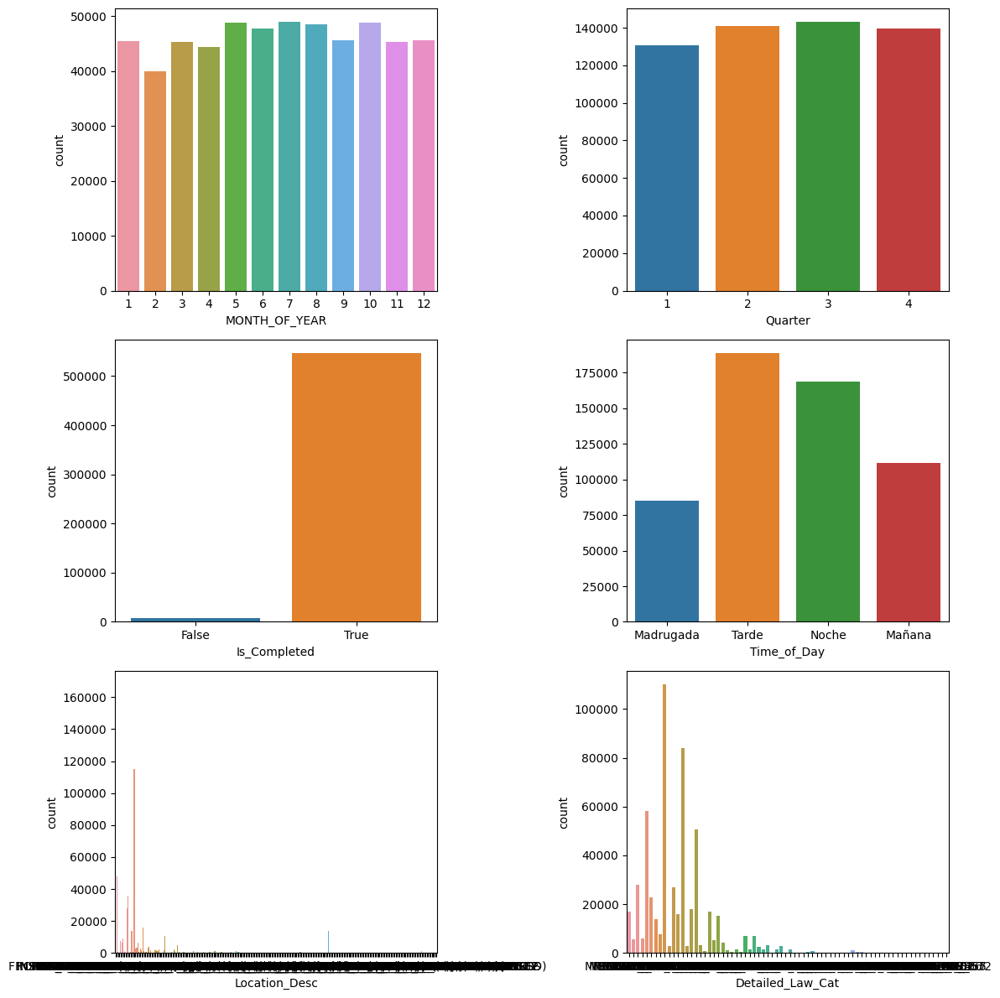

In [0]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define the grid of subplots
fig, axes = plt.subplots(3, 2, figsize=(12, 12))

# Plot each countplot in a subplot
sns.countplot(data=complaintPDF, x='MONTH_OF_YEAR', ax=axes[0, 0])
sns.countplot(data=complaintPDF, x='Quarter', ax=axes[0, 1])
sns.countplot(data=complaintPDF, x='Is_Completed', ax=axes[1, 0])
sns.countplot(data=complaintPDF, x='Time_of_Day', ax=axes[1, 1])
sns.countplot(data=complaintPDF, x='Location_Desc', ax=axes[2, 0])
sns.countplot(data=complaintPDF, x='Detailed_Law_Cat', ax=axes[2, 1])

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


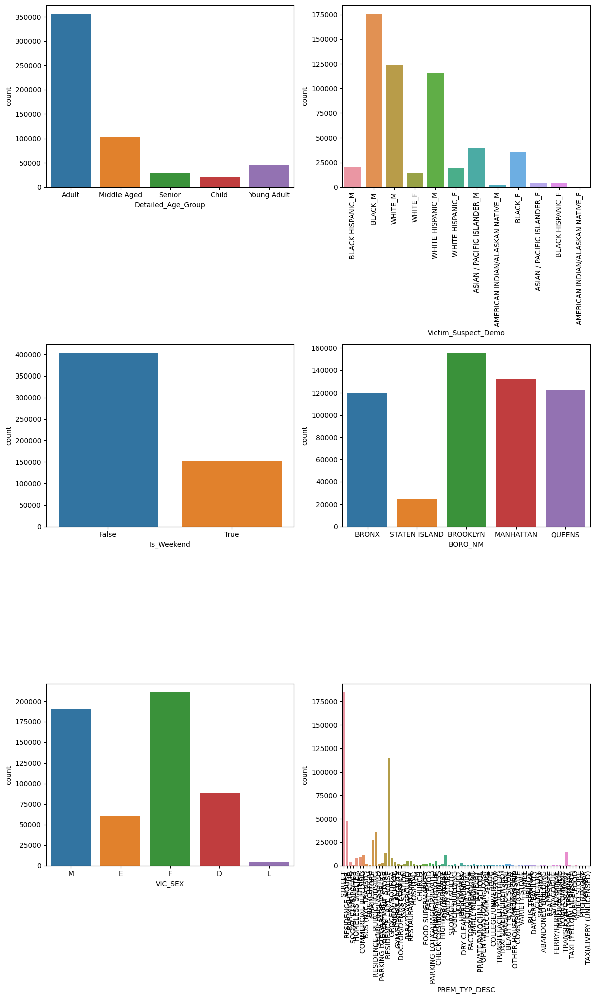

In [0]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define the grid of subplots
fig, axes = plt.subplots(3, 2, figsize=(12, 20))

# Plot each countplot in a subplot
sns.countplot(data=complaintPDF, x='Detailed_Age_Group', ax=axes[0, 0])
sns.countplot(data=complaintPDF, x='Victim_Suspect_Demo', ax=axes[0, 1])
axes[0, 1].tick_params(axis='x', labelrotation=90, labelsize=10)
sns.countplot(data=complaintPDF, x='Is_Weekend', ax=axes[1, 0])
sns.countplot(data=complaintPDF, x='BORO_NM', ax=axes[1, 1])
sns.countplot(data=complaintPDF, x='VIC_SEX', ax=axes[2, 0])
sns.countplot(data=complaintPDF, x='PREM_TYP_DESC', ax=axes[2, 1])
axes[2, 1].tick_params(axis='x', labelrotation=90, labelsize=10)
# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


ML LIB

In [0]:
from pyspark.sql import SparkSession
from pyspark.ml.feature import VectorAssembler, StringIndexer, OneHotEncoder
from pyspark.ml import Pipeline
from pyspark.ml.classification import RandomForestClassifier
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.mllib.evaluation import MulticlassMetrics


#Convertir variables categóricas a numéricas usando StringIndexer
indexers = [StringIndexer(inputCol=column, outputCol=column+"_index") for column in ['BORO_NM', 'LAW_CAT_CD', 'LOC_OF_OCCUR_DESC', 'PD_DESC', 'PREM_TYP_DESC', 'SUSP_SEX', 'VIC_AGE_GROUP', 'VIC_RACE', 'VIC_SEX', 'Time_of_Day', 'Day_of_Week', 'Quarter', 'Detailed_Law_Cat', 'Location_Desc', 'Victim_Suspect_Demo', 'Detailed_Age_Group']]
pipeline = Pipeline(stages=indexers)
complaintDF_indexed = pipeline.fit(Complaint_df).transform(Complaint_df)

# Seleccionar las características y la variable objetivo
feature_cols = ['BORO_NM_index', 'LAW_CAT_CD_index', 'LOC_OF_OCCUR_DESC_index', 'PD_DESC_index', 'PREM_TYP_DESC_index', 'SUSP_SEX_index', 'VIC_AGE_GROUP_index', 'VIC_RACE_index', 'VIC_SEX_index', 'Time_of_Day_index', 'Day_of_Week_index', 'Quarter_index', 'Detailed_Law_Cat_index', 'Location_Desc_index', 'Victim_Suspect_Demo_index', 'Detailed_Age_Group_index']

# Codificar características categóricas
encoder = OneHotEncoder(inputCols=feature_cols, outputCols=[col + "_encoded" for col in feature_cols])
encoder_model = encoder.fit(complaintDF_indexed)
complaintDF_encoded = encoder_model.transform(complaintDF_indexed)

# Seleccionar las características codificadas y la variable objetivo
encoded_feature_cols = [col + "_encoded" for col in feature_cols]
assembler = VectorAssembler(inputCols=encoded_feature_cols, outputCol="features")
complaintDF_final = assembler.transform(complaintDF_encoded)

# Dividir los datos en conjuntos de entrenamiento y prueba
(train_data, test_data) = complaintDF_final.randomSplit([0.7, 0.3], seed=42)

# Entrenar el modelo de Bosque Aleatorio
rf = RandomForestClassifier(labelCol="LAW_CAT_CD_index", featuresCol="features", numTrees=10)
model = rf.fit(train_data)

# Predecir en el conjunto de prueba
predictions = model.transform(test_data)

# Evaluar el rendimiento del modelo
evaluator = MulticlassClassificationEvaluator(labelCol="LAW_CAT_CD_index", predictionCol="prediction")
accuracy = evaluator.evaluate(predictions, {evaluator.metricName: "accuracy"})
precision = evaluator.evaluate(predictions, {evaluator.metricName: "weightedPrecision"})
recall = evaluator.evaluate(predictions, {evaluator.metricName: "weightedRecall"})
f1_score = evaluator.evaluate(predictions, {evaluator.metricName: "f1"})

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1_score)

# Matriz de confusión
predictionAndLabels = predictions.select("prediction", "LAW_CAT_CD_index").rdd.map(lambda row: (float(row.prediction), float(row.LAW_CAT_CD_index)))
metrics = MulticlassMetrics(predictionAndLabels)
confusion_matrix = metrics.confusionMatrix().toArray()
print("Confusion Matrix:")
print(confusion_matrix)

Accuracy: 0.8450071288057897
Precision: 0.7261868424753186
Recall: 0.8450071288057897
F1 Score: 0.7777485006925009


/databricks/spark/python/pyspark/sql/context.py:164: FutureWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
  warnings.warn(


Confusion Matrix:
[[84630.     0.     0.]
 [    0. 55833.     0.]
 [25764.     0.     0.]]


In [0]:
# Métricas de evaluación multiclase
evaluator = MulticlassClassificationEvaluator(labelCol="LAW_CAT_CD_index", predictionCol="prediction")
accuracy = evaluator.evaluate(predictions, {evaluator.metricName: "accuracy"})
precision = evaluator.evaluate(predictions, {evaluator.metricName: "weightedPrecision"})
recall = evaluator.evaluate(predictions, {evaluator.metricName: "weightedRecall"})
f1_score = evaluator.evaluate(predictions, {evaluator.metricName: "f1"})

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1_score)

# Matriz de confusión
predictionAndLabels = predictions.select("prediction", "LAW_CAT_CD_index").rdd.map(lambda row: (float(row.prediction), float(row.LAW_CAT_CD_index)))
metrics = MulticlassMetrics(predictionAndLabels)
confusion_matrix = metrics.confusionMatrix().toArray()
print("Confusion Matrix:")
print(confusion_matrix)

# Métricas de evaluación binaria
binary_evaluator = BinaryClassificationEvaluator(labelCol="LAW_CAT_CD_index", rawPredictionCol="rawPrediction", metricName="areaUnderROC")
area_under_roc = binary_evaluator.evaluate(predictions)
print("Area Under ROC Curve:", area_under_roc)

Accuracy: 0.8450071288057897
Precision: 0.7261868424753186
Recall: 0.8450071288057897
F1 Score: 0.7777485006925009


/databricks/spark/python/pyspark/sql/context.py:164: FutureWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
  warnings.warn(


Confusion Matrix:
[[84630.     0.     0.]
 [    0. 55833.     0.]
 [25764.     0.     0.]]


---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-7452130014839>, line 21
     18 print(confusion_matrix)
     20 # Métricas de evaluación binaria
---> 21 binary_evaluator = BinaryClassificationEvaluator(labelCol="LAW_CAT_CD_index", rawPredictionCol="rawPrediction", metricName="areaUnderROC")
     22 area_under_roc = binary_evaluator.evaluate(predictions)
     23 print("Area Under ROC Curve:", area_under_roc)

NameError: name 'BinaryClassificationEvaluator' is not defined

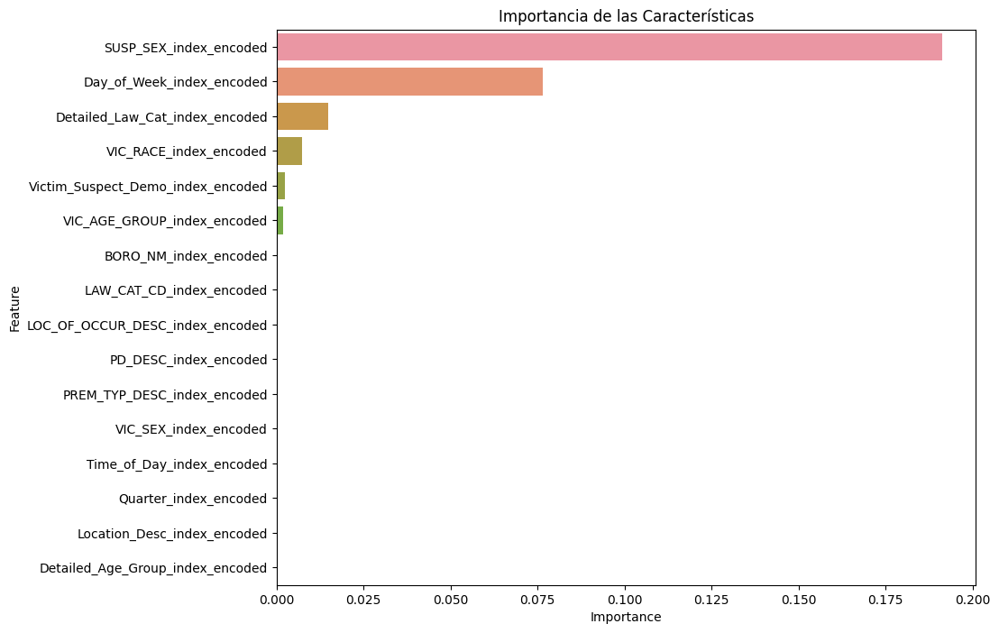

In [0]:
importances = model.featureImportances

# Crear un DataFrame para facilitar la visualización
feature_importances = [(feature, importance) for feature, importance in zip(encoded_feature_cols, importances)]
feature_importances_df = pd.DataFrame(feature_importances, columns=['Feature', 'Importance']).sort_values(by='Importance', ascending=False)

# Graficar la importancia de las características
plt.figure(figsize=(10, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importances_df)
plt.title('Importancia de las Características')
plt.show()

In [0]:
model.getMaxDepth()

5

/root/.ipykernel/1112/command-7452130014842-3506177898:14: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = complaPDF.corr()


<Axes: >

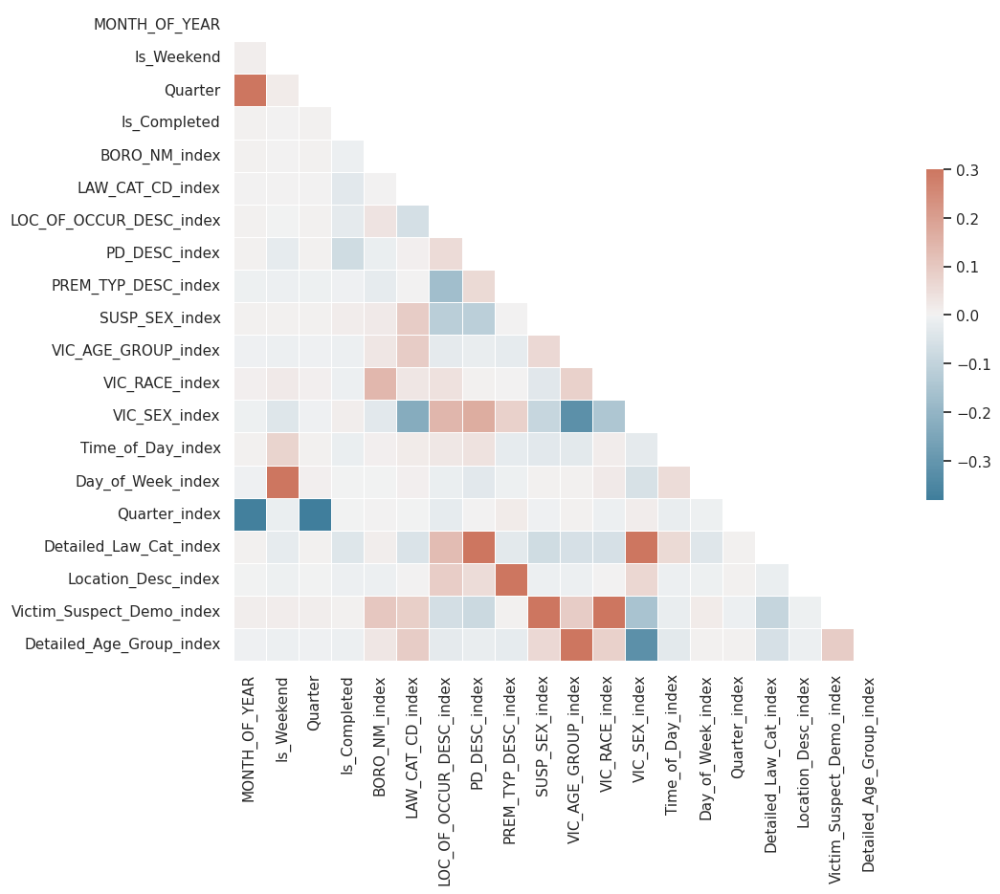

In [0]:
complaPDF = complaintDF_final.toPandas()


import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme(style="white")



# Compute the correlation matrix
corr = complaPDF.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

Randomforest con otros valores

In [0]:
# Entrenar el modelo de Bosque Aleatorio
rf = RandomForestClassifier(labelCol="LAW_CAT_CD_index", featuresCol="features", numTrees=20,maxDepth=10)
model = rf.fit(train_data)

# Predecir en el conjunto de prueba
predictions = model.transform(test_data)

# Evaluar el rendimiento del modelo
evaluator = MulticlassClassificationEvaluator(labelCol="LAW_CAT_CD_index", predictionCol="prediction")
accuracy = evaluator.evaluate(predictions, {evaluator.metricName: "accuracy"})
precision = evaluator.evaluate(predictions, {evaluator.metricName: "weightedPrecision"})
recall = evaluator.evaluate(predictions, {evaluator.metricName: "weightedRecall"})
f1_score = evaluator.evaluate(predictions, {evaluator.metricName: "f1"})

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1_score)

# Matriz de confusión
predictionAndLabels = predictions.select("prediction", "LAW_CAT_CD_index").rdd.map(lambda row: (float(row.prediction), float(row.LAW_CAT_CD_index)))
metrics = MulticlassMetrics(predictionAndLabels)
confusion_matrix = metrics.confusionMatrix().toArray()
print("Confusion Matrix:")
print(confusion_matrix)

Accuracy: 0.9941826538408322
Precision: 0.9942483731269743
Recall: 0.994182653840832
F1 Score: 0.9941435474208886


/databricks/spark/python/pyspark/sql/context.py:164: FutureWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
  warnings.warn(


Confusion Matrix:
[[84630.     0.     0.]
 [    0. 55833.     0.]
 [  967.     0. 24797.]]


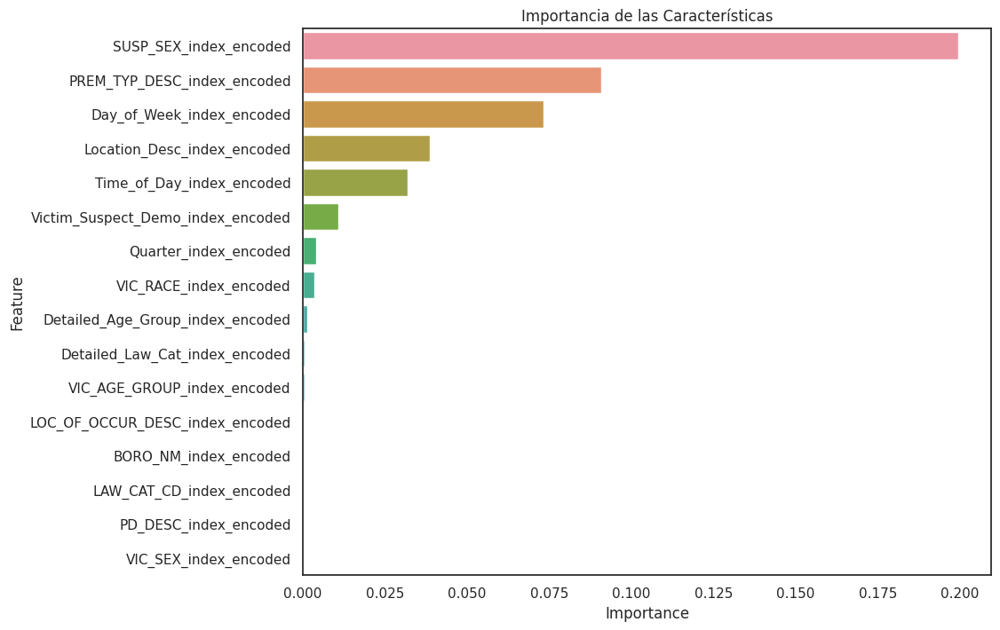

In [0]:
importances = model.featureImportances

# Crear un DataFrame para facilitar la visualización
feature_importances = [(feature, importance) for feature, importance in zip(encoded_feature_cols, importances)]
feature_importances_df = pd.DataFrame(feature_importances, columns=['Feature', 'Importance']).sort_values(by='Importance', ascending=False)

# Graficar la importancia de las características
plt.figure(figsize=(10, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importances_df)
plt.title('Importancia de las Características')
plt.show()

In [0]:
(train_data, test_data) = complaintDF_final.randomSplit([0.7, 0.3], seed=42)
# Entrenar el modelo de Bosque Aleatorio
rf = RandomForestClassifier(labelCol="LAW_CAT_CD_index", featuresCol="features", numTrees=50,maxDepth=20)
model = rf.fit(train_data)

# Predecir en el conjunto de prueba
predictions = model.transform(test_data)

# Evaluar el rendimiento del modelo
evaluator = MulticlassClassificationEvaluator(labelCol="LAW_CAT_CD_index", predictionCol="prediction")
accuracy = evaluator.evaluate(predictions, {evaluator.metricName: "accuracy"})
precision = evaluator.evaluate(predictions, {evaluator.metricName: "weightedPrecision"})
recall = evaluator.evaluate(predictions, {evaluator.metricName: "weightedRecall"})
f1_score = evaluator.evaluate(predictions, {evaluator.metricName: "f1"})

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1_score)

# Matriz de confusión
predictionAndLabels = predictions.select("prediction", "LAW_CAT_CD_index").rdd.map(lambda row: (float(row.prediction), float(row.LAW_CAT_CD_index)))
metrics = MulticlassMetrics(predictionAndLabels)
confusion_matrix = metrics.confusionMatrix().toArray()
print("Confusion Matrix:")
print(confusion_matrix)

Accuracy: 0.9998255397739236
Precision: 0.9998255995353968
Recall: 0.9998255397739235
F1 Score: 0.9998255055960281


/databricks/spark/python/pyspark/sql/context.py:164: FutureWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
  warnings.warn(


Confusion Matrix:
[[8.4630e+04 0.0000e+00 0.0000e+00]
 [0.0000e+00 5.5833e+04 0.0000e+00]
 [2.9000e+01 0.0000e+00 2.5735e+04]]


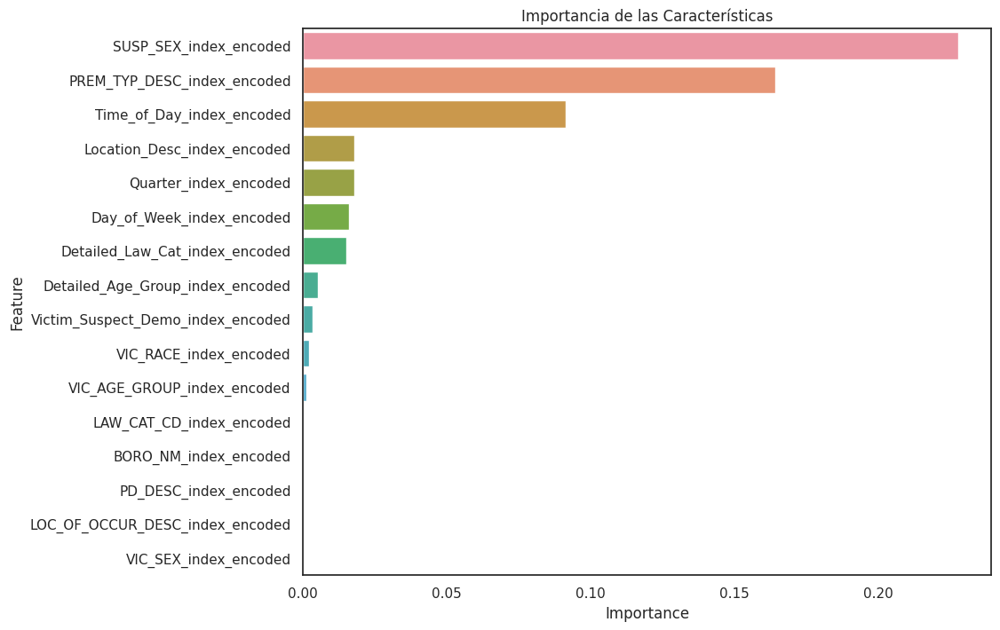

In [0]:
importances = model.featureImportances

# Crear un DataFrame para facilitar la visualización
feature_importances = [(feature, importance) for feature, importance in zip(encoded_feature_cols, importances)]
feature_importances_df = pd.DataFrame(feature_importances, columns=['Feature', 'Importance']).sort_values(by='Importance', ascending=False)

# Graficar la importancia de las características
plt.figure(figsize=(10, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importances_df)
plt.title('Importancia de las Características')
plt.show()

In [0]:
complaintDF_final.columns

['ADDR_PCT_CD',
 'BORO_NM',
 'CMPLNT_FR_DT',
 'CMPLNT_FR_TM',
 'CRM_ATPT_CPTD_CD',
 'JURISDICTION_CODE',
 'JURIS_DESC',
 'KY_CD',
 'LAW_CAT_CD',
 'LOC_OF_OCCUR_DESC',
 'PD_DESC',
 'PREM_TYP_DESC',
 'SUSP_SEX',
 'VIC_AGE_GROUP',
 'VIC_RACE',
 'VIC_SEX',
 'X_COORD_CD',
 'Y_COORD_CD',
 'Latitude',
 'Longitude',
 'Lat_Lon',
 'New Georeferenced Column',
 'MONTH_OF_YEAR',
 'Time_of_Day',
 'Day_of_Week',
 'Is_Weekend',
 'Quarter',
 'Detailed_Law_Cat',
 'Location_Desc',
 'Is_Completed',
 'Victim_Suspect_Demo',
 'Detailed_Age_Group',
 'BORO_NM_index',
 'LAW_CAT_CD_index',
 'LOC_OF_OCCUR_DESC_index',
 'PD_DESC_index',
 'PREM_TYP_DESC_index',
 'SUSP_SEX_index',
 'VIC_AGE_GROUP_index',
 'VIC_RACE_index',
 'VIC_SEX_index',
 'Time_of_Day_index',
 'Day_of_Week_index',
 'Quarter_index',
 'Detailed_Law_Cat_index',
 'Location_Desc_index',
 'Victim_Suspect_Demo_index',
 'Detailed_Age_Group_index',
 'BORO_NM_index_encoded',
 'LAW_CAT_CD_index_encoded',
 'LOC_OF_OCCUR_DESC_index_encoded',
 'PD_DESC_index_e

In [0]:
clusterDF = complaintDF_final.select(['BORO_NM_index',
 'LAW_CAT_CD_index',
 'LOC_OF_OCCUR_DESC_index',
 'PD_DESC_index',
 'PREM_TYP_DESC_index',
 'SUSP_SEX_index',
 'VIC_AGE_GROUP_index',
 'VIC_RACE_index',
 'VIC_SEX_index',
 'Time_of_Day_index',
 'Day_of_Week_index',
 'Quarter_index',
 'Detailed_Law_Cat_index',
 'Location_Desc_index',
 'Victim_Suspect_Demo_index',
 'Detailed_Age_Group_index',
 'BORO_NM_index_encoded',
 'LAW_CAT_CD_index_encoded',
 'LOC_OF_OCCUR_DESC_index_encoded',
 'PD_DESC_index_encoded',
 'PREM_TYP_DESC_index_encoded',
 'SUSP_SEX_index_encoded',
 'VIC_AGE_GROUP_index_encoded',
 'VIC_RACE_index_encoded',
 'VIC_SEX_index_encoded',
 'Time_of_Day_index_encoded',
 'Day_of_Week_index_encoded',
 'Quarter_index_encoded',
 'Detailed_Law_Cat_index_encoded',
 'Location_Desc_index_encoded',
 'Victim_Suspect_Demo_index_encoded',
 'Detailed_Age_Group_index_encoded',
 'features'])


In [0]:
(train_data, test_data) = clusterDF.randomSplit([0.7, 0.3], seed=42)

In [0]:
from pyspark.sql import SparkSession
from pyspark.ml.clustering import KMeans
from pyspark.ml.evaluation import ClusteringEvaluator

# Iniciar una sesión de Spark


# Suponiendo que tu DataFrame se llama df y que ya tiene la columna 'features'

# Definir el modelo K-means
kmeans = KMeans(featuresCol='features', k=8)  # Puedes ajustar el valor de k según sea necesario

# Entrenar el modelo
model = kmeans.fit(train_data)

# Realizar predicciones
predictions = model.transform(train_data)

# Evaluar el modelo
evaluator = ClusteringEvaluator()

# Calcular la métrica de Silhouette
silhouette = evaluator.evaluate(predictions)
print(f"Silhouette with squared euclidean distance = {silhouette}")

# Mostrar los resultados
predictions.show()


Silhouette with squared euclidean distance = 0.13873692617735212
+-----------+---------+------------+-------------------+----------------+-----------------+-------------------+-----+-----------+-----------------+--------------------+--------------------+--------+-------------+--------------------+-------+----------+----------+-----------------+-----------------+--------------------+------------------------+-------------+-----------+-----------+----------+-------+----------------+--------------------+------------+--------------------+------------------+-------------+----------------+-----------------------+-------------+-------------------+--------------+-------------------+--------------+-------------+-----------------+-----------------+-------------+----------------------+-------------------+-------------------------+------------------------+---------------------+------------------------+-------------------------------+---------------------+---------------------------+----------------

In [0]:
predictions.count()

388464

In [0]:

(predic50, test50) = predictions.randomSplit([0.5, 0.5], seed=42)

In [0]:
# Convertir el DataFrame de PySpark a Pandas
pandas_df = predic50.select("features", "prediction").toPandas()

# Separar las características para visualización (solo si tienes pocas dimensiones)
features_array = pandas_df['features'].apply(lambda x: pd.Series(x.toArray()))
pandas_df = pd.concat([features_array, pandas_df['prediction']], axis=1)






---------------------------------------------------------------------------
KeyError                                  Traceback (most recent call last)
File /databricks/python/lib/python3.11/site-packages/pandas/core/indexes/base.py:3802, in Index.get_loc(self, key, method, tolerance)
   3801 try:
-> 3802     return self._engine.get_loc(casted_key)
   3803 except KeyError as err:

File /databricks/python/lib/python3.11/site-packages/pandas/_libs/index.pyx:138, in pandas._libs.index.IndexEngine.get_loc()

File /databricks/python/lib/python3.11/site-packages/pandas/_libs/index.pyx:165, in pandas._libs.index.IndexEngine.get_loc()

File pandas/_libs/hashtable_class_helper.pxi:5745, in pandas._libs.hashtable.PyObjectHashTable.get_item()

File pandas/_libs/hashtable_class_helper.pxi:5753, in pandas._libs.hashtable.PyObjectHashTable.get_item()

KeyError: 'features'

The above exception was the direct cause of the following exception:

KeyError                                  Traceback (most 

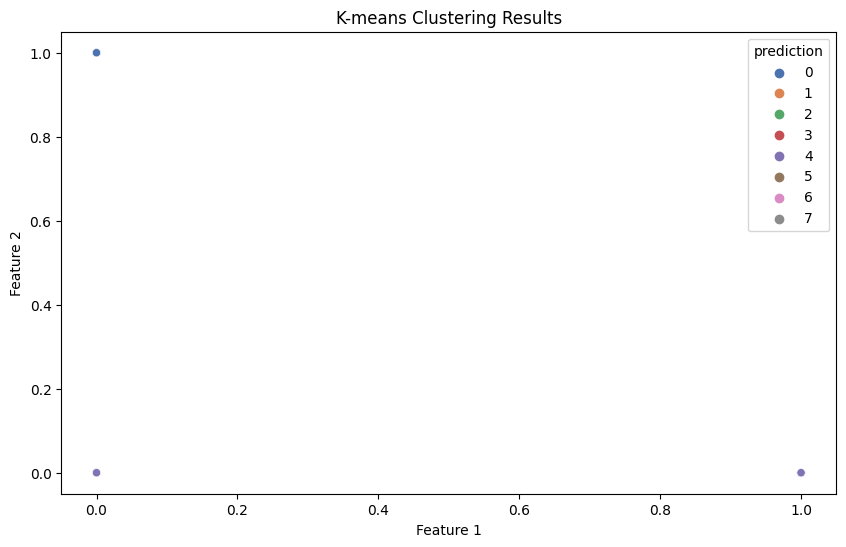

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
# Graficar los clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(x=pandas_df[0], y=pandas_df[1], hue=pandas_df['prediction'], palette="deep", legend="full")
plt.title("K-means Clustering Results")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.show()

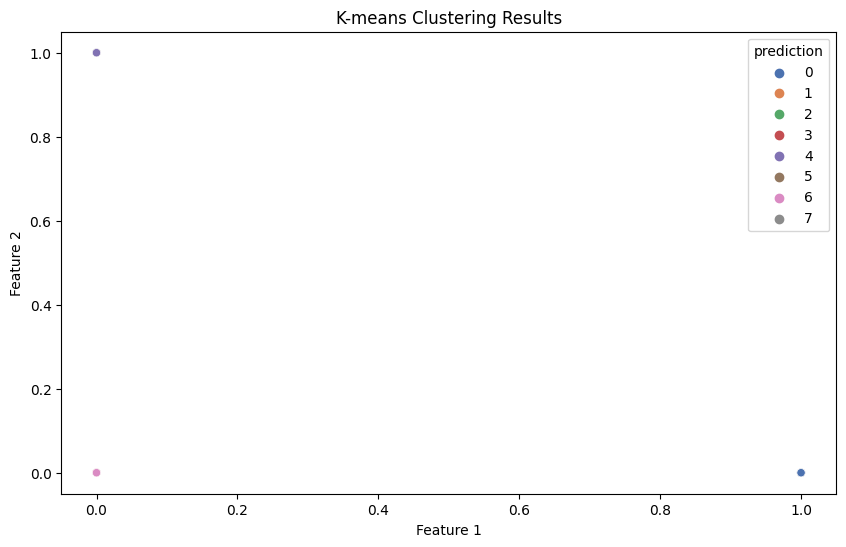

In [0]:
# Graficar los clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(x=pandas_df[1], y=pandas_df[2], hue=pandas_df['prediction'], palette="deep", legend="full")
plt.title("K-means Clustering Results")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.show()

In [0]:

from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(pandas_df[0], pandas_df[1], pandas_df[2], c=pandas_df['prediction'], cmap='viridis')
ax.set_title("K-means Clustering Results")
ax.set_xlabel("Feature 1")
ax.set_ylabel("Feature 2")
ax.set_zlabel("Feature 3")
plt.show()